# 05f trajectory analysis indo GCSF ct

comparison of trajectory analysis with indo an GCSF and control, results are part of Fig 4. 

adding up the expression values of several genes


docker run 
--rm 
-d 
--name scanpy2 
-p 8880:8888 
-e JUPYTER_ENABLE_LAB=YES 
-v /Users/efast/Documents/:/home/jovyan/work 
scanpy:1.4.6




## 1) Loading packages + data

In [1]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


In [2]:
%matplotlib inline

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

import scipy
from scipy import stats
import statistics

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [3]:
sc.settings.set_figure_params(dpi=80, dpi_save=300, vector_friendly=True)

In [4]:
adata = sc.read(
    './sc_objects/LT_preprocessed.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 15355 × 14408 
    obs: 'sample', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'Female', 'Female_cat', 'Female_str', 'sex_sample', 'batch', 'rXist', 'leiden', 'umap_density_sample'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'diffmap_evals', 'draw_graph', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'sex_sample_colors', 'umap', 'umap_density_sample_params'
    obsm: 'X_diffmap', 'X_draw_graph_fr', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

#### Check the previous clustering (Leiden 6 clusters 40 KNN, 0.7 resolution)

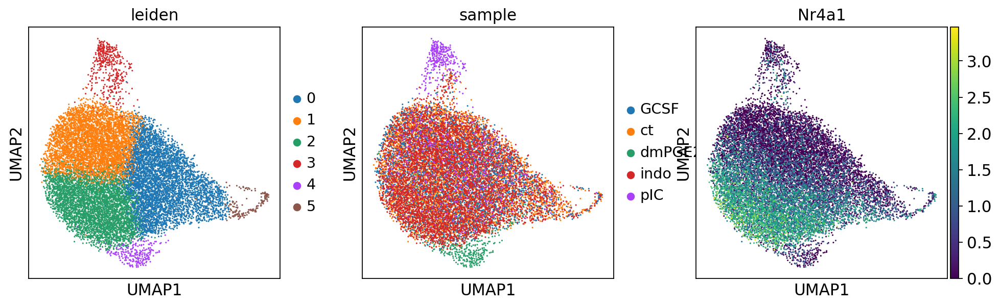

In [6]:
sc.pl.umap(adata, color=['leiden','sample','Nr4a1'])

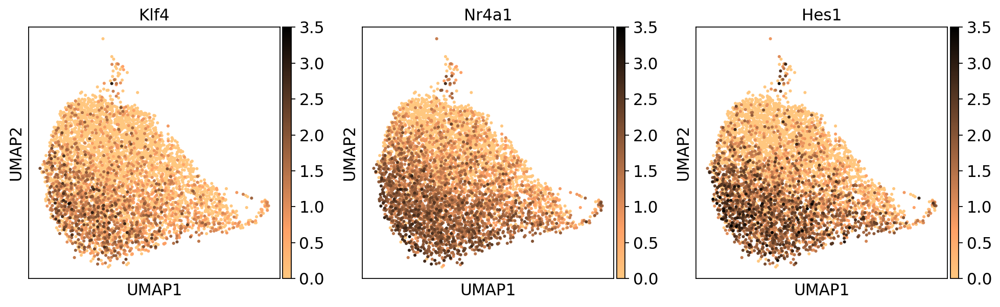

In [7]:
sc.pl.umap(adata[adata.obs['sample']=='ct'], color=['Klf4','Nr4a1', 'Hes1'], size = 30, 
           cmap = 'copper_r', vmax = 3.5, save='_LT_ct_Klf4_Nr4a1_Hes1.pdf')

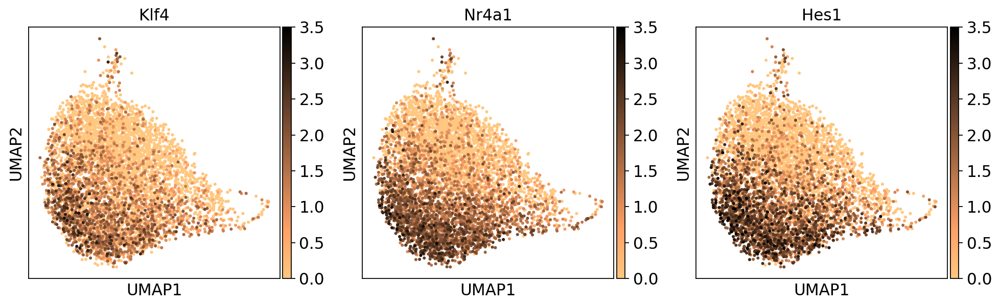

In [8]:
sc.pl.umap(adata[adata.obs['sample']=='indo'], color=['Klf4','Nr4a1', 'Hes1'], size = 30, 
           cmap = 'copper_r', vmax = 3.5, save='_LT_indo_Klf4_Nr4a1_Hes1.pdf')

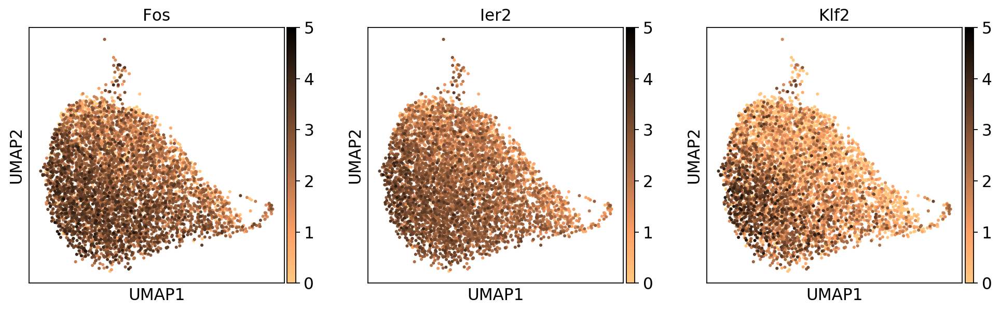

In [9]:
sc.pl.umap(adata[adata.obs['sample']=='ct'], color=['Fos','Ier2', 'Klf2'], size = 30, 
           cmap = 'copper_r', vmax = 5, save='_LT_ct_Fos_Ier2_Klf2.pdf')

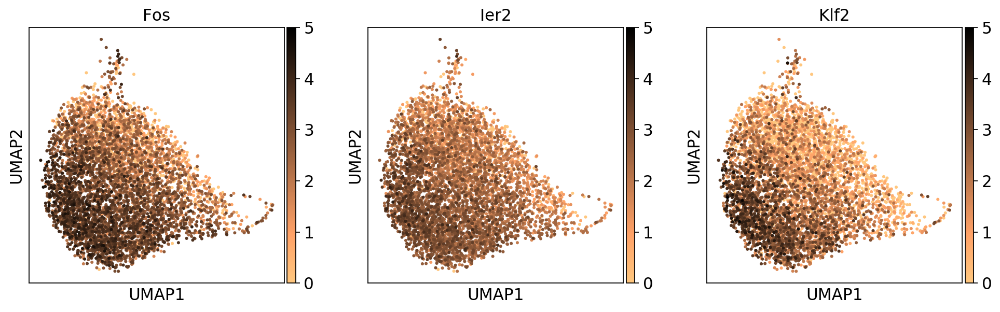

In [10]:
sc.pl.umap(adata[adata.obs['sample']=='indo'], color=['Fos','Ier2', 'Klf2'], size = 30, 
           cmap = 'copper_r', vmax = 5, save='_LT_indo_Fos_Ier2_Klf2.pdf')

## Select only at ct and GCSF + only cluster 2 and 1

In [11]:
# select only indo and ct from the dataframe and only cluster 0 and 1

adata_ctindo = adata[(adata.obs['sample']=='ct') | (adata.obs['sample']=='GCSF') | (adata.obs['sample']=='indo')].copy()
adata_ctindo

AnnData object with n_obs × n_vars = 14131 × 14408 
    obs: 'sample', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'Female', 'Female_cat', 'Female_str', 'sex_sample', 'batch', 'rXist', 'leiden', 'umap_density_sample'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'diffmap_evals', 'draw_graph', 'leiden', 'neighbors', 'pca', 'sample_colors', 'sex_sample_colors', 'umap', 'umap_density_sample_params'
    obsm: 'X_diffmap', 'X_draw_graph_fr', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

In [12]:
adata_ctindo = adata_ctindo[(adata_ctindo.obs['leiden']=='2') | (adata_ctindo.obs['leiden']=='1')].copy()
adata_ctindo

AnnData object with n_obs × n_vars = 9017 × 14408 
    obs: 'sample', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'Female', 'Female_cat', 'Female_str', 'sex_sample', 'batch', 'rXist', 'leiden', 'umap_density_sample'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'diffmap_evals', 'draw_graph', 'leiden', 'neighbors', 'pca', 'sample_colors', 'sex_sample_colors', 'umap', 'umap_density_sample_params'
    obsm: 'X_diffmap', 'X_draw_graph_fr', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

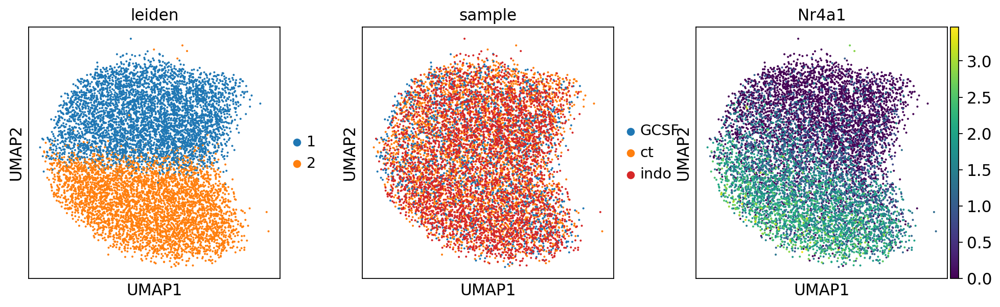

In [13]:
sc.pl.umap(adata_ctindo, color=['leiden','sample','Nr4a1'])

### Redo PCA and UMAP

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:10)


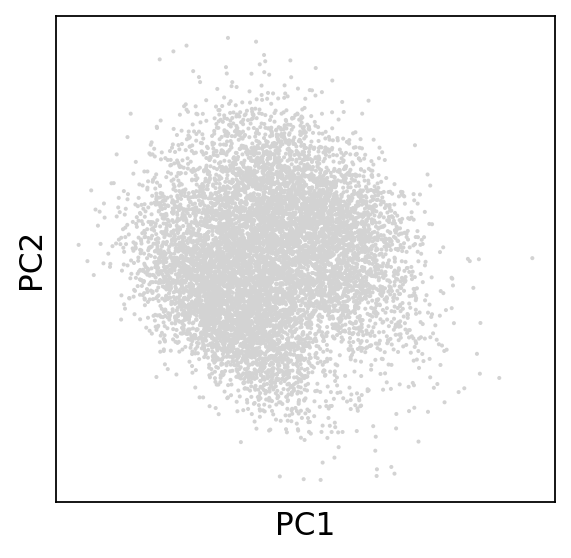

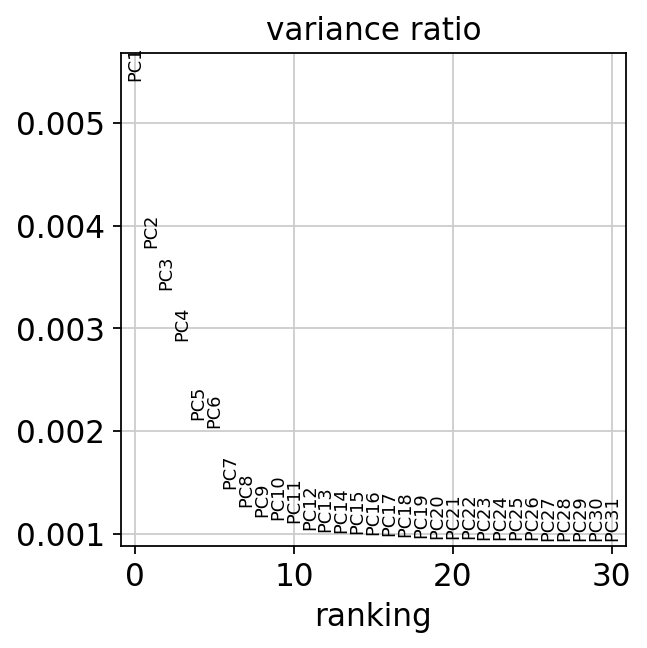

In [14]:
#Recalculating PCA for subset
sc.pp.pca(adata_ctindo, svd_solver='arpack')
sc.pl.pca(adata_ctindo)
sc.pl.pca_variance_ratio(adata_ctindo)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:12)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


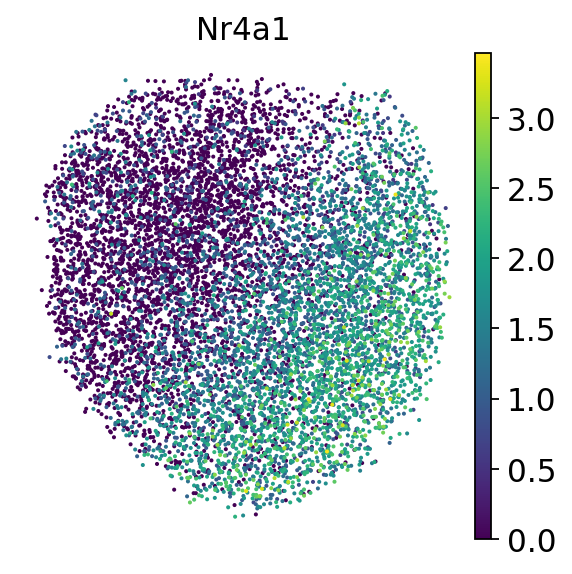

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


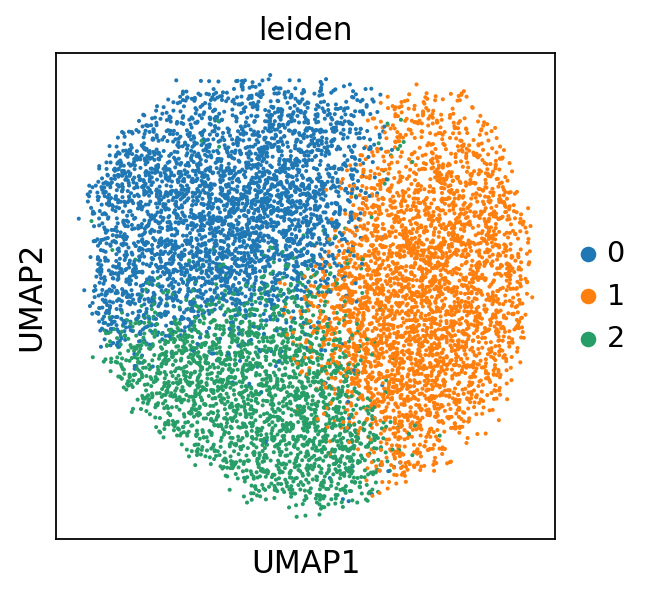

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


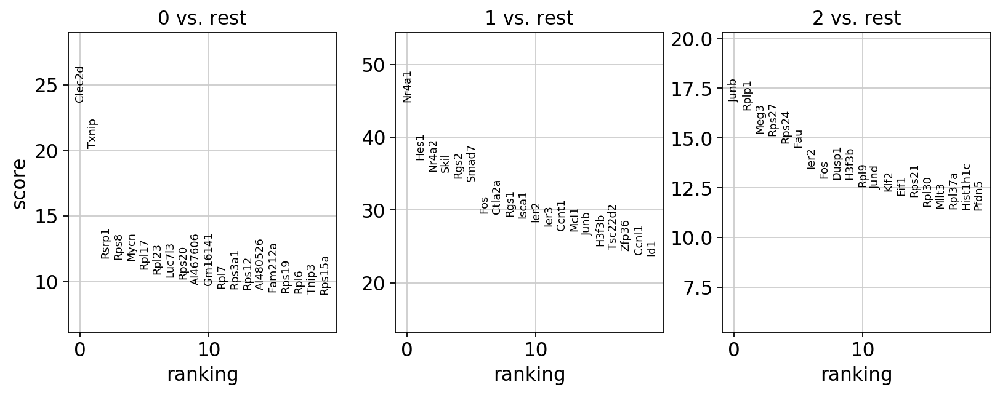

In [15]:
sc.pp.neighbors(adata_ctindo, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_ctindo)
sc.pl.umap(adata_ctindo, color=['Nr4a1'], legend_loc='on data', frameon=False)
sc.tl.leiden(adata_ctindo, resolution=0.5)
sc.pl.umap(adata_ctindo, color=['leiden'])
sc.tl.rank_genes_groups(adata_ctindo, 'leiden')
sc.pl.rank_genes_groups(adata_ctindo, n_genes=20, sharey=False)

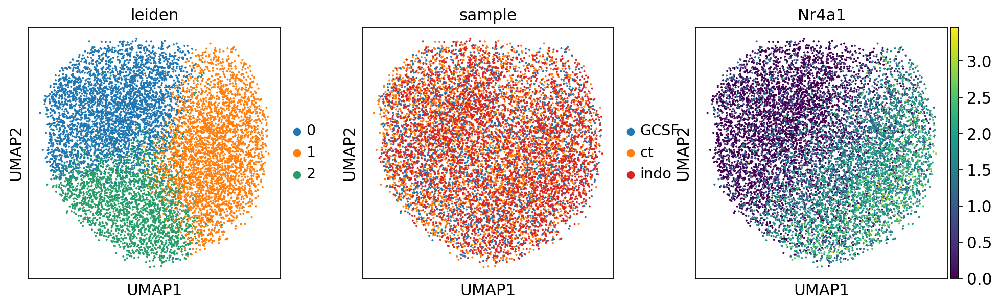

In [16]:
sc.pl.umap(adata_ctindo, color=['leiden','sample','Nr4a1'])

In [17]:
# recalculate neigbors

sc.tl.diffmap(adata_ctindo)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.92405504 0.89529663 0.87157184 0.8634335  0.846073
     0.83246464 0.82090247 0.80852544 0.8052959  0.80294156 0.79438555
     0.7877139  0.7829056  0.7786752 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


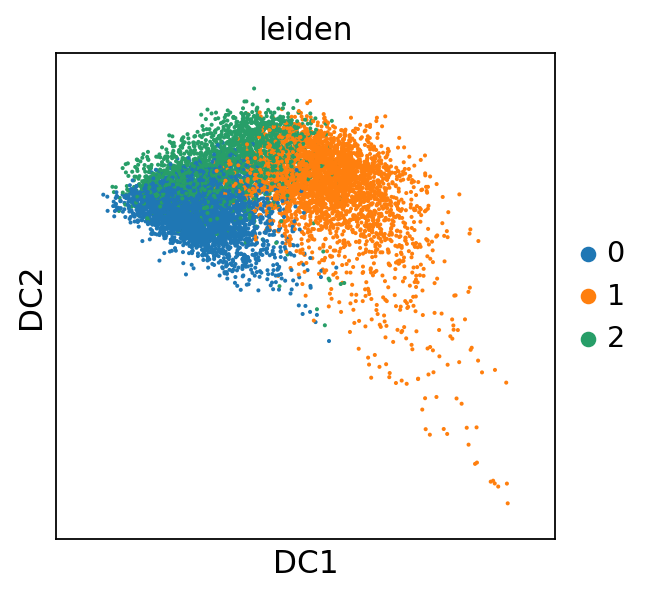

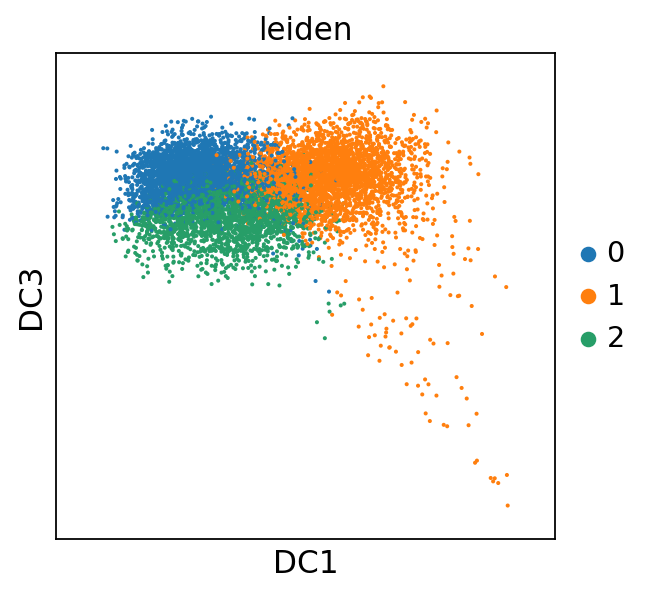

In [18]:
sc.pl.diffmap(adata_ctindo, components='1,2', color='leiden')
sc.pl.diffmap(adata_ctindo, components='1,3', color='leiden')

subcluster cluster '1' to exclude outlyer cells

running Leiden clustering
    finished: found 6 clusters and added
    'subcluster', the cluster labels (adata.obs, categorical) (0:00:00)


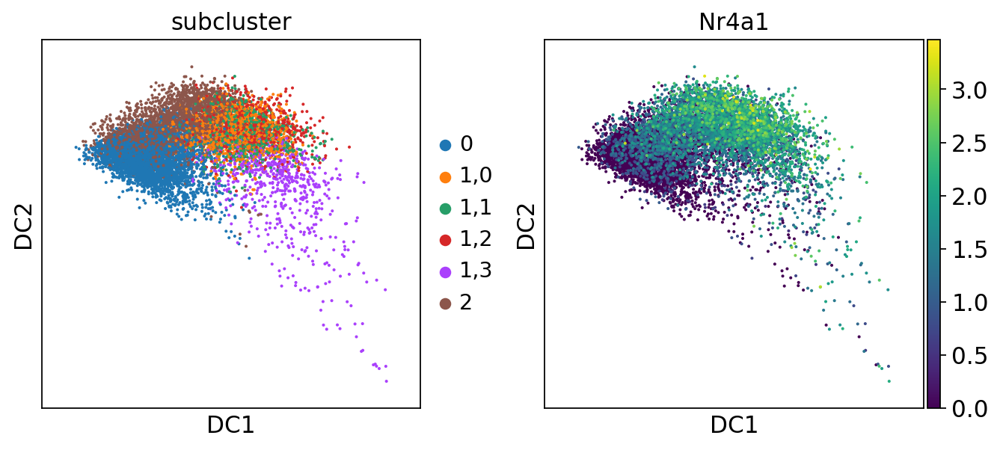

In [19]:
sc.tl.leiden(adata_ctindo, restrict_to=('leiden', ['1']), resolution=0.5, key_added='subcluster')
sc.pl.diffmap(adata_ctindo, color = ['subcluster','Nr4a1'])

In [20]:
adata_ctindo = adata_ctindo[~adata_ctindo.obs['subcluster'].isin(['1,3'])]

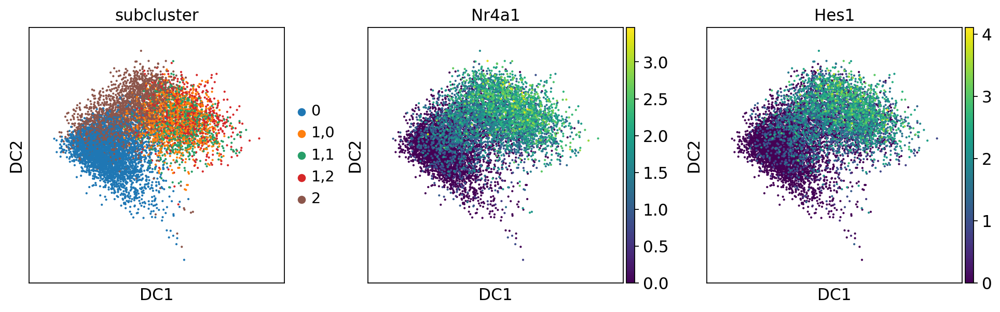

In [21]:
sc.pl.diffmap(adata_ctindo, color = ['subcluster','Nr4a1', 'Hes1'])

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:23)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


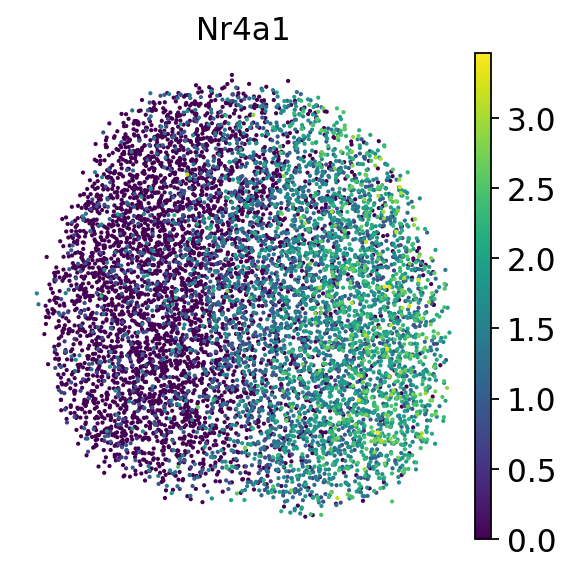

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


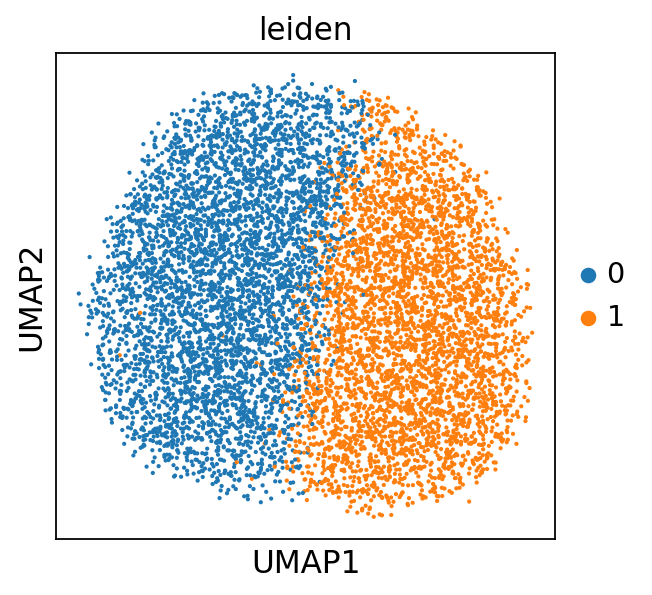

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


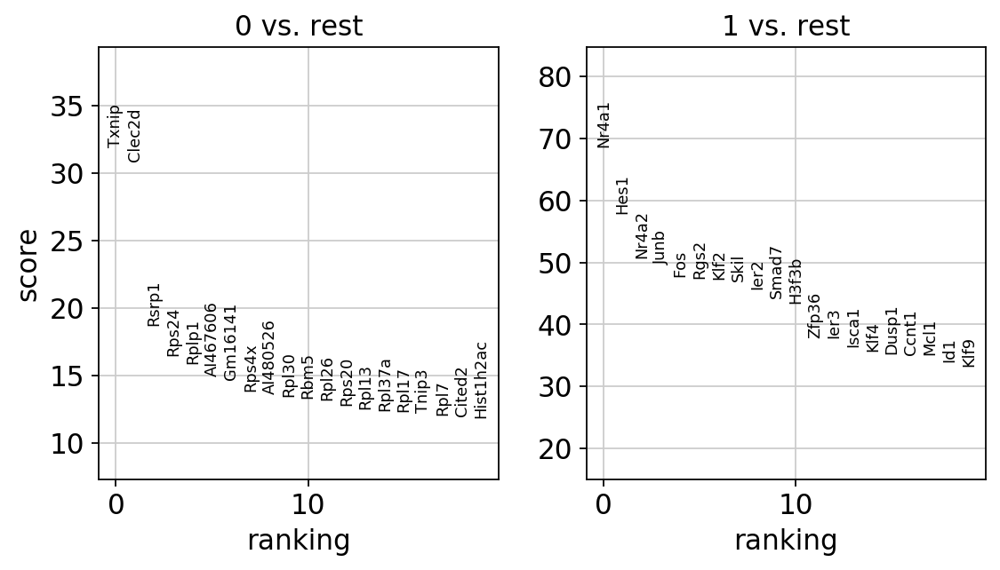

In [22]:
sc.pp.pca(adata_ctindo, svd_solver='arpack')
sc.pp.neighbors(adata_ctindo, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_ctindo)
sc.pl.umap(adata_ctindo, color=['Nr4a1'], legend_loc='on data', frameon=False)
sc.tl.leiden(adata_ctindo, resolution=0.5)
sc.pl.umap(adata_ctindo, color=['leiden'])
sc.tl.rank_genes_groups(adata_ctindo, 'leiden')
sc.pl.rank_genes_groups(adata_ctindo, n_genes=20, sharey=False)

### Make a channel from a combination of highly expressed genes in Activated cluster

In [23]:
# make metacolumn with high expression of immediate early genes

adata_ctindo.obs['combo_high'] = adata_ctindo.raw[: , 'Nr4a1'].X.toarray() + adata_ctindo.raw[: , 'Nr4a2'].X.toarray() + adata_ctindo.raw[: , 'Hes1'].X.toarray()

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9192472  0.8822361  0.8612341  0.8470919  0.82380366
     0.8180711  0.8038329  0.79895526 0.795243   0.78749025 0.77911365
     0.7774939  0.7725648  0.76492834]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


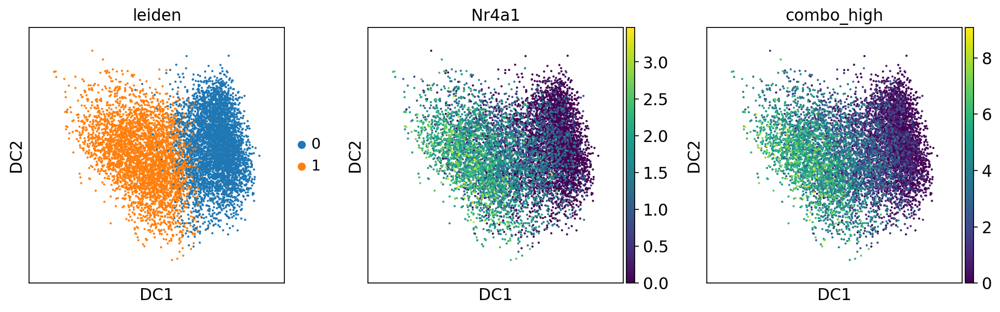

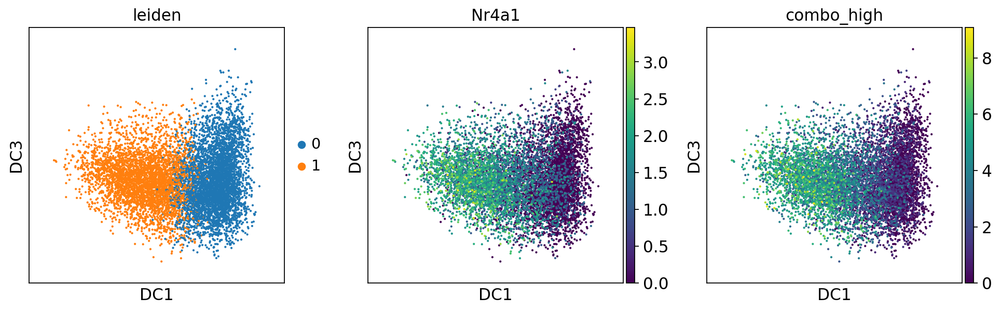

In [24]:
sc.tl.diffmap(adata_ctindo)
sc.pl.diffmap(adata_ctindo, components='1,2', color=['leiden', 'Nr4a1', 'combo_high'])
sc.pl.diffmap(adata_ctindo, components='1,3', color=['leiden', 'Nr4a1', 'combo_high'])

In [25]:
# set root cells to cell with highest score for combo of activated markers

max_stem_id = np.argmax(adata_ctindo.obs['combo_high'])
adata_ctindo.uns['iroot'] = np.flatnonzero(adata_ctindo.obs.index == max_stem_id)[0]

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:61: FutureWarning: 
The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.
  return bound(*args, **kwds)


In [26]:
# compute diffusion pseudotime

sc.tl.dpt(adata_ctindo)

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


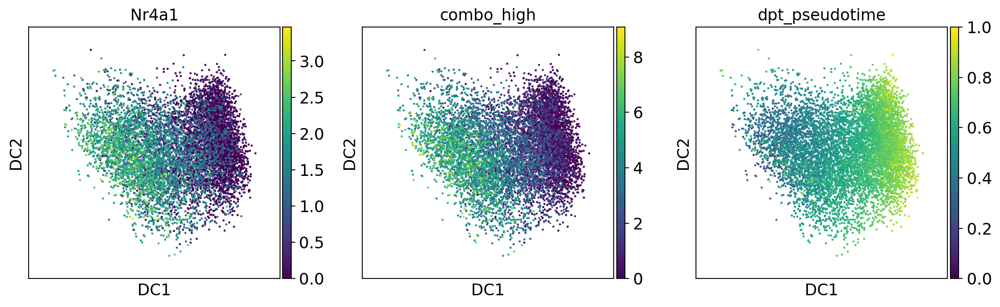

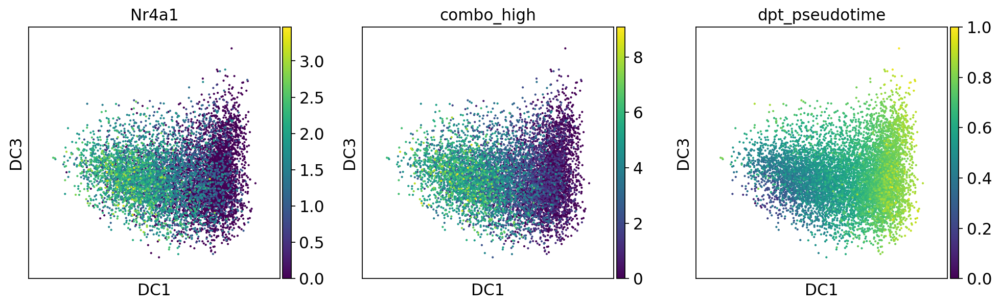

In [27]:
sc.pl.diffmap(adata_ctindo, components='1,2', color=['Nr4a1', 'combo_high', 'dpt_pseudotime'])
sc.pl.diffmap(adata_ctindo, components='1,3', color=['Nr4a1', 'combo_high', 'dpt_pseudotime'])

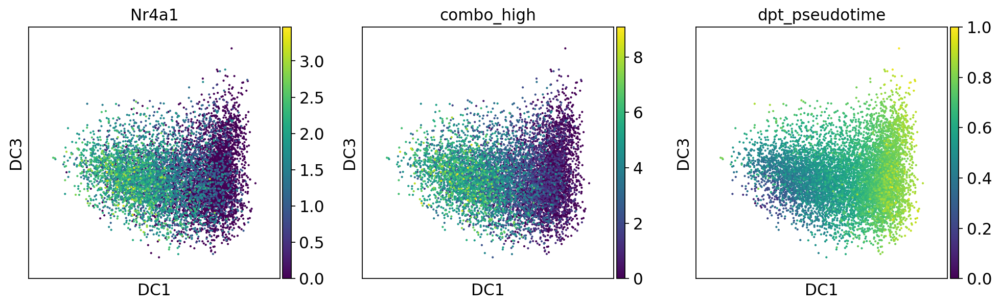

In [28]:
# for figure

sc.pl.diffmap(adata_ctindo, components='1,3', color=['Nr4a1', 'combo_high', 'dpt_pseudotime'], 
              save='_diffusiontime.pdf')

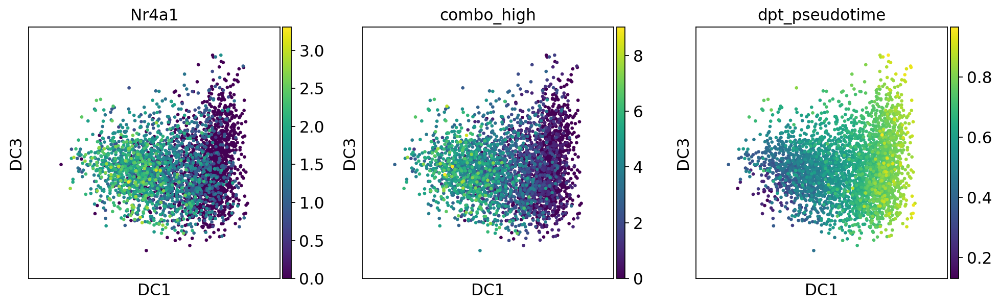

In [29]:
sc.pl.diffmap(adata_ctindo[adata_ctindo.obs['sample']=='ct'], components='1,3', color=['Nr4a1', 'combo_high', 'dpt_pseudotime'])

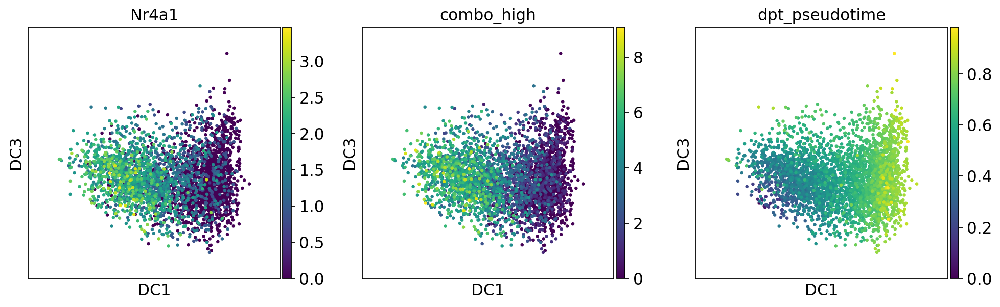

In [30]:
sc.pl.diffmap(adata_ctindo[adata_ctindo.obs['sample']=='indo'], components='1,3', color=['Nr4a1', 'combo_high', 'dpt_pseudotime'])

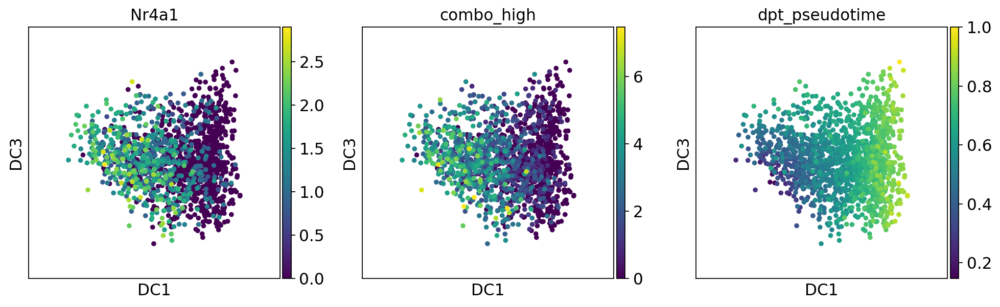

In [31]:
sc.pl.diffmap(adata_ctindo[adata_ctindo.obs['sample']=='GCSF'], components='1,3', color=['Nr4a1', 'combo_high', 'dpt_pseudotime'])

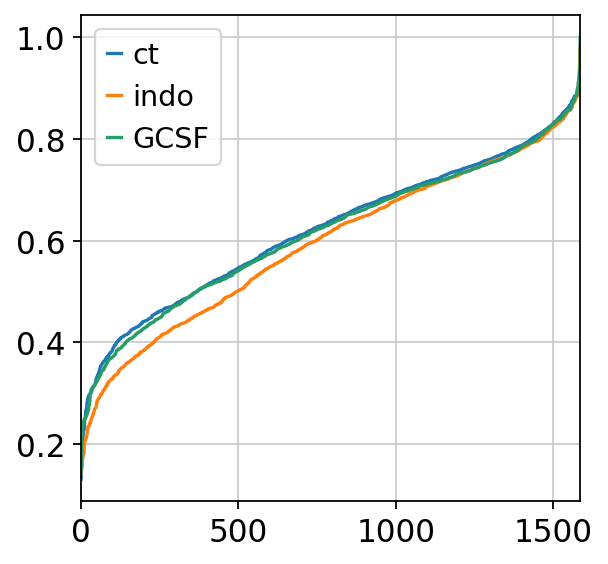

In [32]:
rank_ct = adata_ctindo.obs[adata_ctindo.obs['sample']=='ct']['dpt_pseudotime'].sort_values()
rank_GCSF = adata_ctindo.obs[adata_ctindo.obs['sample']=='GCSF']['dpt_pseudotime'].sort_values()
rank_indo = adata_ctindo.obs[adata_ctindo.obs['sample']=='indo']['dpt_pseudotime'].sort_values()

#downsample the ct and indosample
rank_ct_s = rank_ct.sample(n=len(rank_GCSF))
rank_indo_s = rank_indo.sample(n=len(rank_GCSF))

#sort values again
rank_indo_s = rank_indo_s.sort_values()
rank_ct_s = rank_ct_s.sort_values()
rank_GCSF_s = rank_GCSF.sort_values()

#reset the index for concat
rank_indo_s.reset_index(drop=True, inplace=True)
rank_ct_s.reset_index(drop=True, inplace=True)
rank_GCSF_s.reset_index(drop=True, inplace=True)

merge_indoct = pd.concat([rank_ct_s, rank_indo_s, rank_GCSF_s], 
                         axis=1, ignore_index=True)
merge_indoct.columns = ['ct', 'indo', 'GCSF']

merge_indoct.plot()

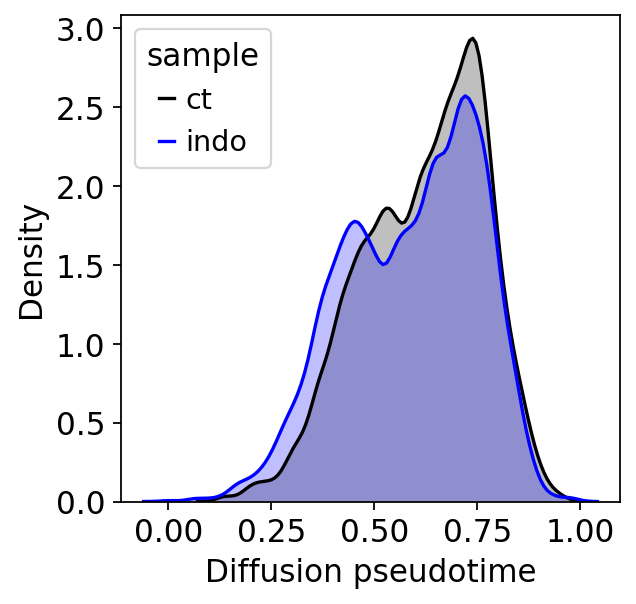

In [33]:
p1=sns.kdeplot(adata_ctindo.obs[adata_ctindo.obs['sample']=='ct']['dpt_pseudotime'], shade=True, 
               color="k", bw= 0.02)
p1=sns.kdeplot(adata_ctindo.obs[adata_ctindo.obs['sample']=='indo']['dpt_pseudotime'], shade=True,
               color="b", bw= 0.02)

plt.ylabel("Density")
plt.xlabel("Diffusion pseudotime")
plt.grid(b=None) # turns off gridlines
handles, labels = p1.get_legend_handles_labels()
labels = ['ct', 'indo']
myorder = [0, 1]
handles = [handles[i] for i in myorder]
plt.legend(handles, labels, title='sample', loc='upper left')
plt.savefig('./figures/KDE_indo_ct.pdf', bbox_inches = "tight")

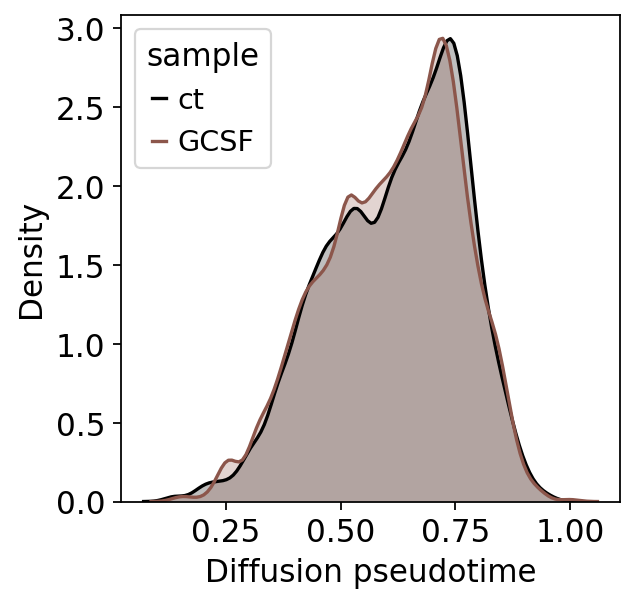

In [34]:
p1=sns.kdeplot(adata_ctindo.obs[adata_ctindo.obs['sample']=='ct']['dpt_pseudotime'], shade=True, 
               color="k", bw= 0.02)
p1=sns.kdeplot(adata_ctindo.obs[adata_ctindo.obs['sample']=='GCSF']['dpt_pseudotime'], shade=True,
               color="tab:brown", bw= 0.02)

plt.ylabel("Density")
plt.xlabel("Diffusion pseudotime")
plt.grid(b=None) # turns off gridlines
handles, labels = p1.get_legend_handles_labels()
labels = ['ct', 'GCSF']
myorder = [ 0,1]
handles = [handles[i] for i in myorder]
plt.legend(handles, labels, title='sample', loc='upper left')
plt.savefig('./figures/KDE_GCSF_ct.pdf', bbox_inches = "tight")

### quantiles based on pseudotime

In [35]:
## calculate quantiles

adata_ctindo.obs['quantile_pseudotime'] = pd.qcut(adata_ctindo.obs['dpt_pseudotime'], q=10, precision=2)

In [36]:
bins = pd.DataFrame(adata_ctindo.obs['quantile_pseudotime'].sort_values().groupby(adata_ctindo.obs['sample']).value_counts())

In [37]:
pd.DataFrame(adata_ctindo.obs['quantile_pseudotime'].sort_values().value_counts())

,quantile_pseudotime
"(0.79, 1.0]",838
"(0.75, 0.79]",838
"(0.71, 0.75]",838
"(0.67, 0.71]",838
"(0.63, 0.67]",838
"(0.58, 0.63]",838
"(0.52, 0.58]",838
"(0.46, 0.52]",838
"(0.39, 0.46]",838
"(-0.01, 0.39]",838


In [38]:
bins

quantile_pseudotime
sample quantile_pseudotime                     
GCSF   (0.52, 0.58]                         178
       (0.58, 0.63]                         169
       (0.63, 0.67]                         167
       (0.79, 1.0]                          166
       (0.67, 0.71]                         165
       (0.71, 0.75]                         164
       (0.46, 0.52]                         160
       (0.75, 0.79]                         145
       (0.39, 0.46]                         143
       (-0.01, 0.39]                        130
ct     (0.75, 0.79]                         367
       (0.71, 0.75]                         355
       (0.79, 1.0]                          349
       (0.58, 0.63]                         348
       (0.52, 0.58]                         347
       (0.67, 0.71]                         346
       (0.46, 0.52]                         344
       (0.63, 0.67]                         331
       (0.39, 0.46]                         294
       (-0.01, 0.39]                        247
indo   (-0.01, 0.39]                        461
       (0.39, 0.46]                         401
       (0.63, 0.67]                         340
       (0.46, 0.52]                         334
       (0.67, 0.71]                         327
       (0.75, 0.79]                         326
       (0.79, 1.0]                          323
       (0.58, 0.63]                         321
       (0.71, 0.75]                         319
       (0.52, 0.58]                         313

In [39]:
bins_p = pd.pivot_table(adata_ctindo.obs, values='combo_high', index=['quantile_pseudotime'], columns=['sample'], aggfunc=[len])
bins_p

len              
sample                GCSF     ct   indo
quantile_pseudotime                     
(-0.01, 0.39]        130.0  247.0  461.0
(0.39, 0.46]         143.0  294.0  401.0
(0.46, 0.52]         160.0  344.0  334.0
(0.52, 0.58]         178.0  347.0  313.0
(0.58, 0.63]         169.0  348.0  321.0
(0.63, 0.67]         167.0  331.0  340.0
(0.67, 0.71]         165.0  346.0  327.0
(0.71, 0.75]         164.0  355.0  319.0
(0.75, 0.79]         145.0  367.0  326.0
(0.79, 1.0]          166.0  349.0  323.0

In [40]:
percent_bins_p = bins_p.iloc[:,0:9].div(bins_p.sum(axis=0), axis=1)
percent_bins_p

len                    
sample                   GCSF        ct      indo
quantile_pseudotime                              
(-0.01, 0.39]        0.081916  0.074219  0.133045
(0.39, 0.46]         0.090107  0.088341  0.115729
(0.46, 0.52]         0.100819  0.103365  0.096392
(0.52, 0.58]         0.112161  0.104267  0.090332
(0.58, 0.63]         0.106490  0.104567  0.092641
(0.63, 0.67]         0.105230  0.099459  0.098124
(0.67, 0.71]         0.103970  0.103966  0.094372
(0.71, 0.75]         0.103340  0.106671  0.092063
(0.75, 0.79]         0.091367  0.110276  0.094084
(0.79, 1.0]          0.104600  0.104868  0.093218

In [41]:
percent_bins_p.iloc[0:20,:].div(percent_bins_p.sum(axis=1), axis=0)

len                    
sample                   GCSF        ct      indo
quantile_pseudotime                              
(-0.01, 0.39]        0.283269  0.256653  0.460077
(0.39, 0.46]         0.306302  0.300300  0.393398
(0.46, 0.52]         0.335419  0.343890  0.320691
(0.52, 0.58]         0.365632  0.339897  0.294471
(0.58, 0.63]         0.350645  0.344313  0.305042
(0.63, 0.67]         0.347508  0.328450  0.324042
(0.67, 0.71]         0.343919  0.343908  0.312172
(0.71, 0.75]         0.342101  0.353128  0.304772
(0.75, 0.79]         0.308958  0.372899  0.318143
(0.79, 1.0]          0.345573  0.346458  0.307969

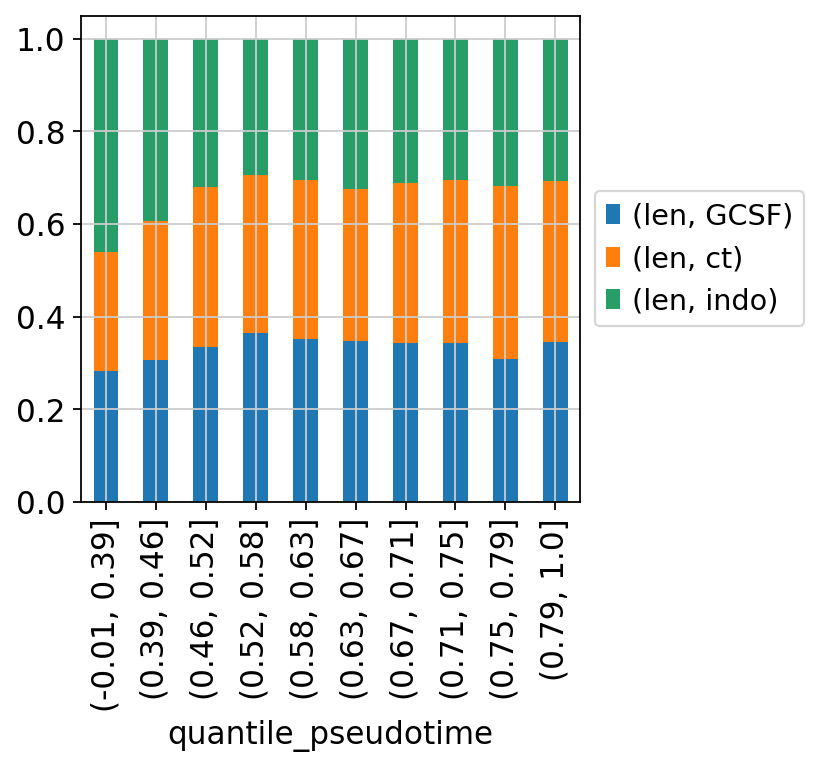

In [42]:
percent_bins_p.iloc[0:20,:].div(percent_bins_p.sum(axis=1), axis=0).plot.bar(stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

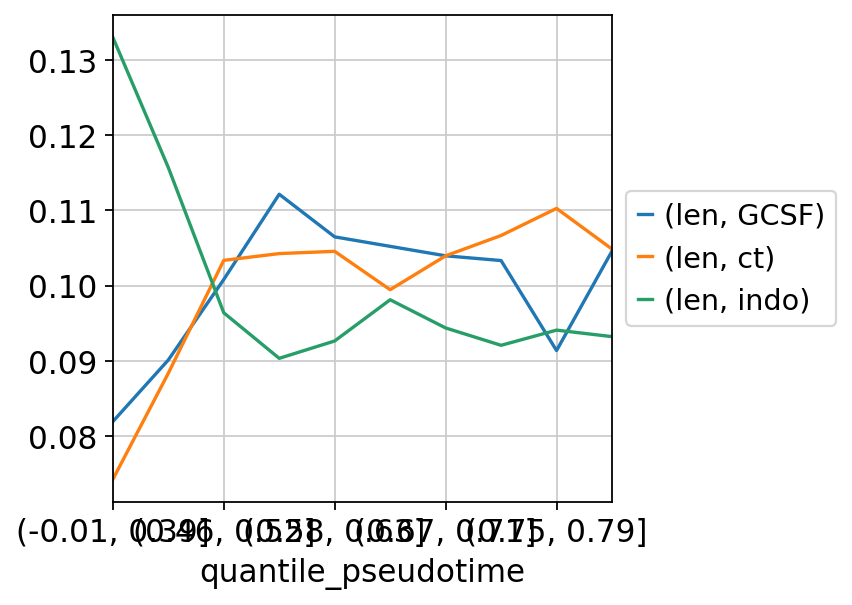

In [43]:
percent_bins_p.plot()
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

In [44]:
percent_bins_p.columns = percent_bins_p.columns.droplevel()
percent_bins_p

sample,GCSF,ct,indo
quantile_pseudotime,,,
"(-0.01, 0.39]",0.081916,0.074219,0.133045
"(0.39, 0.46]",0.090107,0.088341,0.115729
"(0.46, 0.52]",0.100819,0.103365,0.096392
"(0.52, 0.58]",0.112161,0.104267,0.090332
"(0.58, 0.63]",0.106490,0.104567,0.092641
"(0.63, 0.67]",0.105230,0.099459,0.098124
"(0.67, 0.71]",0.103970,0.103966,0.094372
"(0.71, 0.75]",0.103340,0.106671,0.092063
"(0.75, 0.79]",0.091367,0.110276,0.094084


In [45]:
#select only indo and control
indoct = pd.merge(percent_bins_p['ct'], percent_bins_p['indo'], left_index = True, right_index = True)

In [46]:
indoct.iloc[0:20,:].div(indoct.sum(axis=1), axis=0)

,ct,indo
quantile_pseudotime,,
"(-0.01, 0.39]",0.358089,0.641911
"(0.39, 0.46]",0.432897,0.567103
"(0.46, 0.52]",0.517453,0.482547
"(0.52, 0.58]",0.535804,0.464196
"(0.58, 0.63]",0.530239,0.469761
"(0.63, 0.67]",0.503378,0.496622
"(0.67, 0.71]",0.524186,0.475814
"(0.71, 0.75]",0.536751,0.463249
"(0.75, 0.79]",0.539618,0.460382


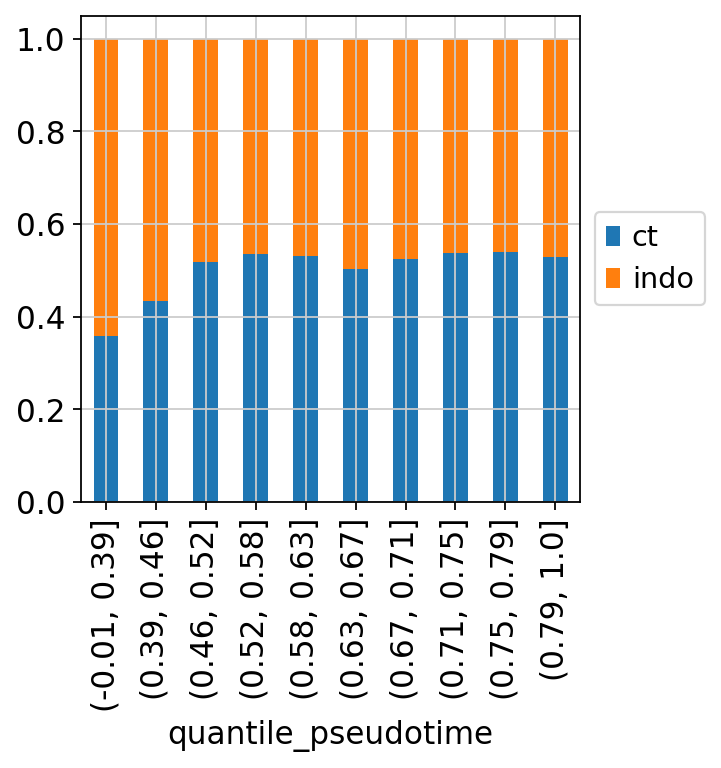

In [47]:
indoct.iloc[0:20,:].div(indoct.sum(axis=1), axis=0).plot.bar(stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

In [48]:
#select only GCSF and control
gcsfct = pd.merge(percent_bins_p['ct'], percent_bins_p['GCSF'], left_index = True, right_index = True)

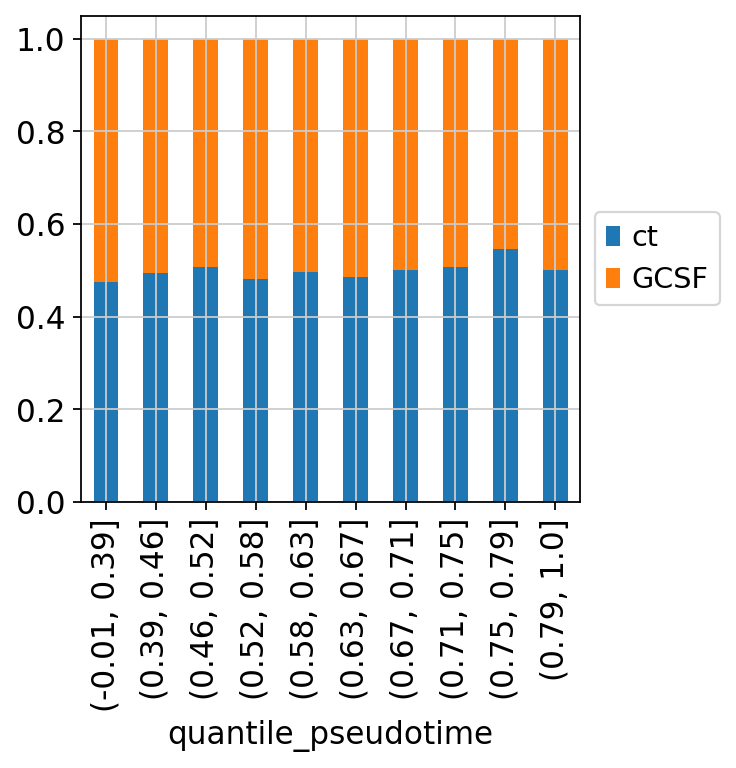

In [49]:
gcsfct.iloc[0:20,:].div(gcsfct.sum(axis=1), axis=0).plot.bar(stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

### quantiles based on rank

In [50]:
# make a new column where all the cells are ranked according to pseudotime

rank_indo = pd.DataFrame(adata_ctindo.obs[adata_ctindo.obs['sample']=='indo']['dpt_pseudotime'].sort_values())
rank_ct = pd.DataFrame(adata_ctindo.obs[adata_ctindo.obs['sample']=='ct']['dpt_pseudotime'].sort_values())
rank_gcsf = pd.DataFrame(adata_ctindo.obs[adata_ctindo.obs['sample']=='GCSF']['dpt_pseudotime'].sort_values())

#make a column 'Rank' that has ascending numbers
rank_indo.insert(0, 'Rank', range(0, 0 + len(rank_indo)))
rank_ct.insert(0, 'Rank', range(0, 0 + len(rank_ct)))
rank_gcsf.insert(0, 'Rank', range(0, 0 + len(rank_gcsf)))

# divide into deciles
bin_labels_10 = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
rank_indo['quantile_rank'] = pd.qcut(rank_indo['Rank'],
                              q=[0, .1, .2, .3, .4, .5, .6, .7, .8, .9, 1],
                              labels=bin_labels_10)
bin_labels_10 = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
rank_ct['quantile_rank'] = pd.qcut(rank_ct['Rank'],
                              q=[0, .1, .2, .3, .4, .5, .6, .7, .8, .9, 1],
                              labels=bin_labels_10)
bin_labels_10 = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
rank_gcsf['quantile_rank'] = pd.qcut(rank_gcsf['Rank'],
                              q=[0, .1, .2, .3, .4, .5, .6, .7, .8, .9, 1],
                              labels=bin_labels_10)


# merge this back together
concat_column = pd.concat([rank_indo, rank_ct, rank_gcsf], 
                         axis=0, ignore_index=False)


concat_column = concat_column.drop(columns='dpt_pseudotime')
concat_column
# merge this back into the .obs df
adata_ctindo.obs = adata_ctindo.obs.merge(concat_column, how='left', left_index = True, right_index = True)

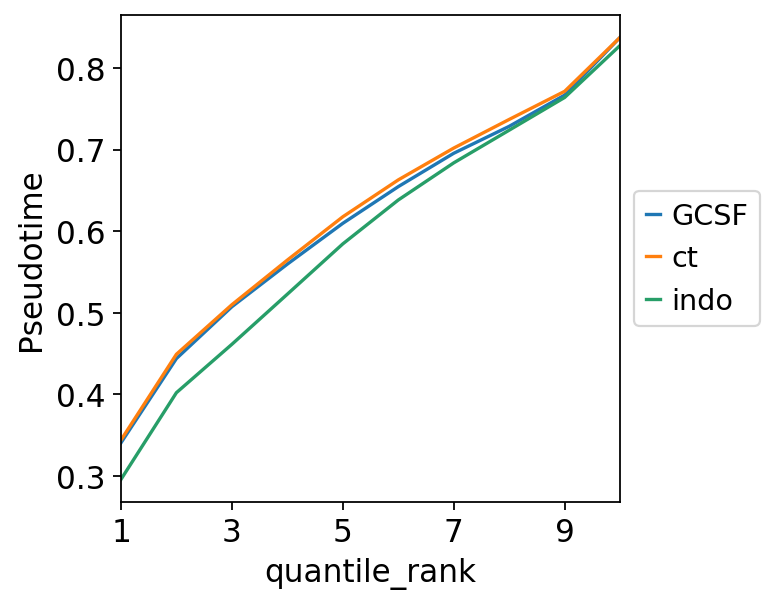

In [51]:
pd.pivot_table(adata_ctindo.obs, values='dpt_pseudotime', index=['quantile_rank'], columns=['sample'], aggfunc=np.mean).plot()
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("Pseudotime")
plt.grid(b=None) # turns off gridlines

In [94]:
def plot_2gene(gene_name):
    column_name = gene_name + '_gene'
    out_name = './figures/quantile_rank_' + gene_name + '.pdf'
    adata_ctindo.obs[column_name] = adata_ctindo[: , gene_name].X
    pd.pivot_table(adata_ctindo.obs[(adata_ctindo.obs['sample']=='ct') | (adata_ctindo.obs['sample']== 'indo')], values=column_name, 
                   index=['quantile_rank'], columns=['sample'], aggfunc=np.mean).plot(color=['k', 'b'])
    plt.ylabel("Mean expression")
    plt.grid(b=None) # turns off gridlines
    labels = ['ct', 'indo']
    plt.legend(labels,  loc='upper right')
    plt.savefig(out_name, format='pdf', bbox_inches = "tight")
    return plt.show()

In [95]:
def plot_2gene_gcsf(gene_name):
    column_name = gene_name + '_gene'
    out_name = './figures/quantile_rank_onlyGCSF_' + gene_name + '.pdf'
    adata_ctindo.obs[column_name] = adata_ctindo[: , gene_name].X
    adata_ctindo.obs.sort_values(by='sample', ascending=True)
    ax = pd.pivot_table(adata_ctindo.obs[(adata_ctindo.obs['sample']=='ct') | (adata_ctindo.obs['sample']== 'GCSF')], values=column_name, 
                   index=['quantile_rank'], columns=['sample'], aggfunc=np.mean).plot(color=[ 'tab:brown', 'k'])
    plt.ylabel("Mean expression")
    handles, labels = ax.get_legend_handles_labels()
    labels = ['ct', 'GCSF']
    myorder = [1, 0]
    handles = [handles[i] for i in myorder]
    plt.legend(handles, labels,  loc='upper right')
    plt.grid(b=None) # turns off gridlines
    plt.savefig(out_name, format='pdf', bbox_inches = "tight")
    return plt.show()
#title='sample',

In [109]:
def plot_3gene(gene_name):    
    column_name = gene_name + '_gene'
    out_name = './figures/quantile_rank_withGCSF_' + gene_name + '.pdf'
    adata_ctindo.obs[column_name] = adata_ctindo[: , gene_name].X
    adata_ctindo.obs.sort_values(by='sample', ascending=True)
    ax = pd.pivot_table(adata_ctindo.obs, values=column_name, 
                   index=['quantile_rank'], columns=['sample'], aggfunc=np.mean).plot(color=['tab:brown', 'k', 'b'])
    
    plt.ylabel("Mean expression")
    plt.grid(b=None) # turns off gridlines
    handles, labels = ax.get_legend_handles_labels()
    labels = ['ct', 'indo', 'GCSF']
    myorder = [1, 2, 0]
    handles = [handles[i] for i in myorder]
    plt.legend(handles, labels, loc='upper right')
    plt.savefig(out_name, format='pdf', bbox_inches = "tight")
    return plt.show()

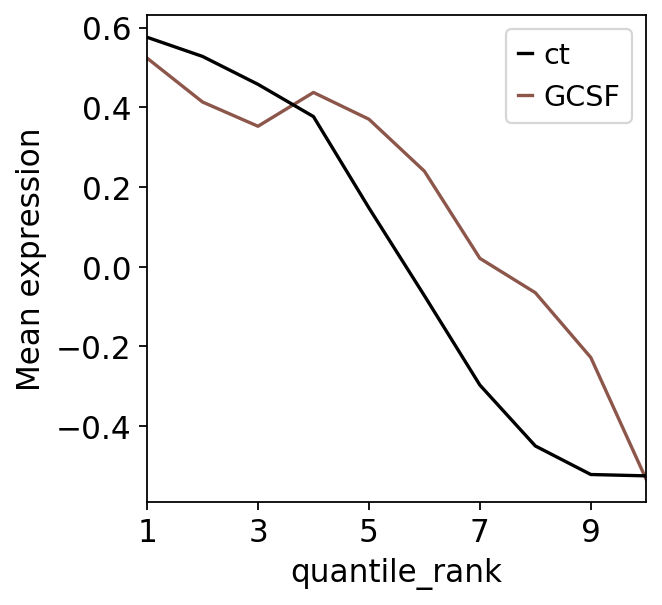

In [111]:
plot_2gene_gcsf('Klf2')

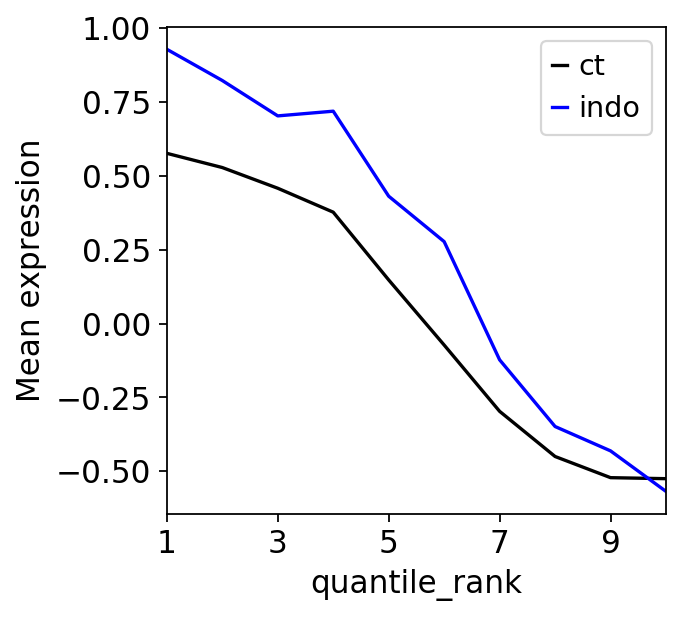

In [112]:
plot_2gene('Klf2')

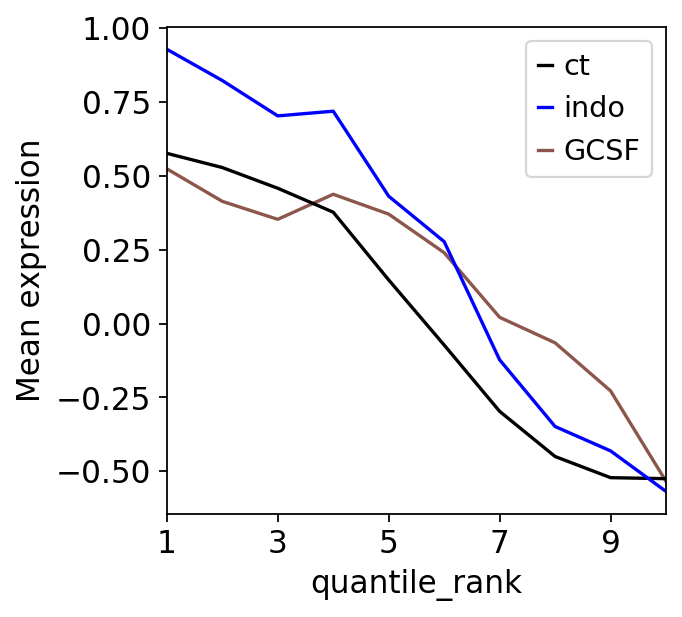

In [113]:
plot_3gene('Klf2')

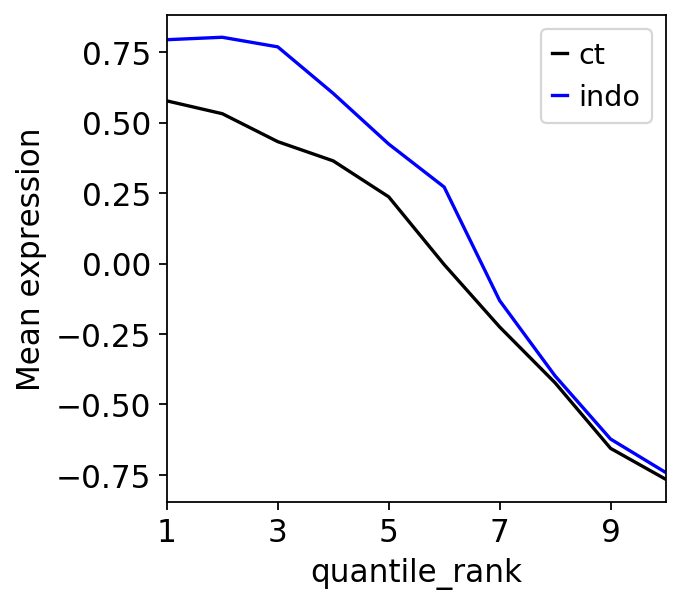

In [114]:
plot_2gene('Fos')

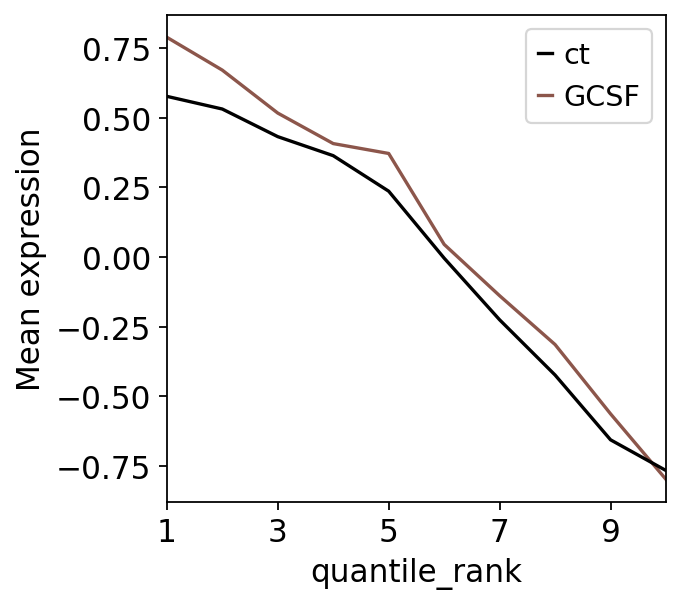

In [115]:
plot_2gene_gcsf('Fos')

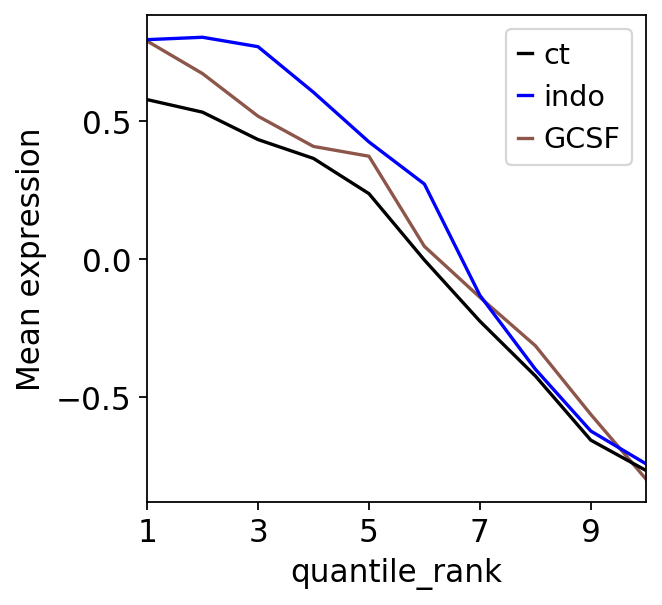

In [116]:
plot_3gene('Fos')

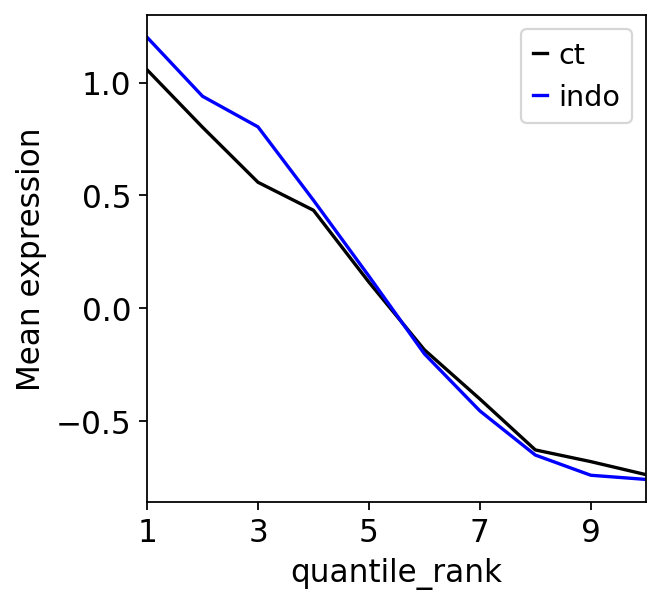

In [117]:
plot_2gene('Nr4a1')

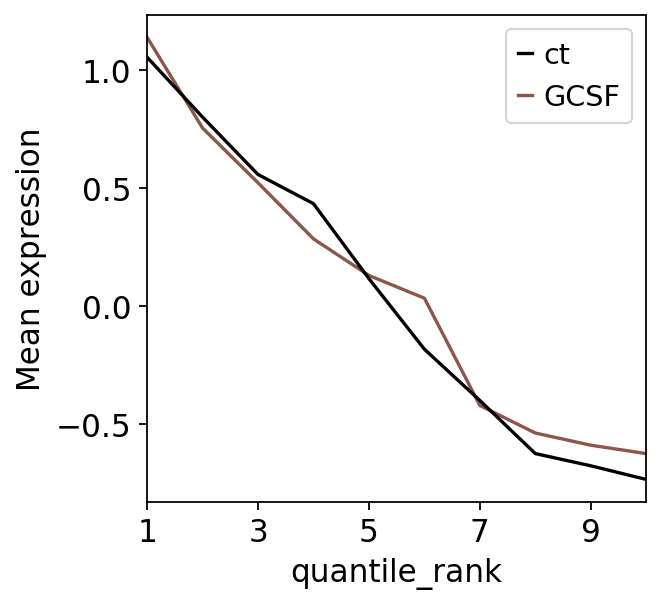

In [118]:
plot_2gene_gcsf('Nr4a1')

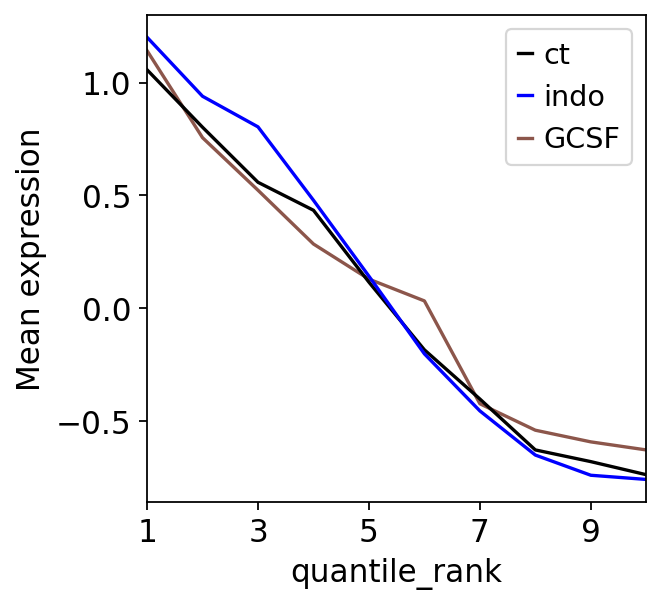

In [119]:
plot_3gene('Nr4a1')

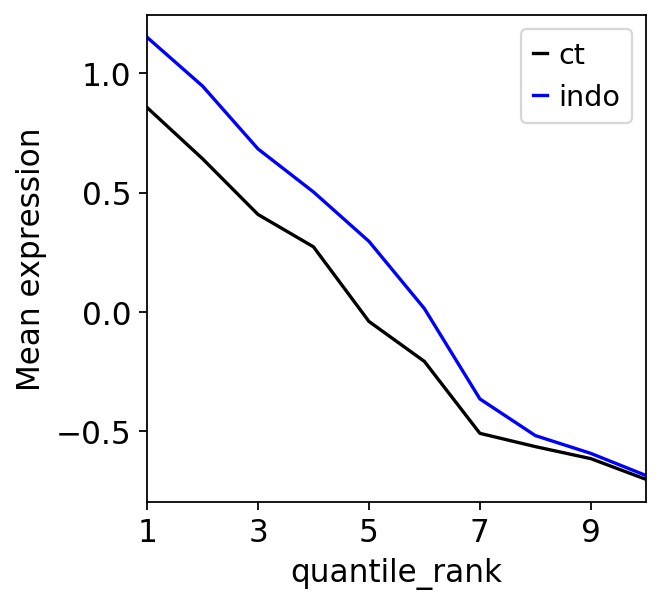

In [120]:
plot_2gene('Hes1')

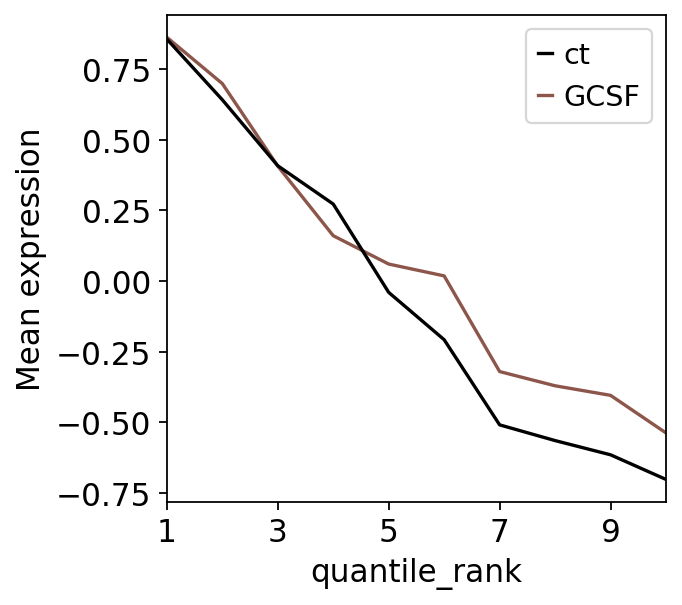

In [121]:
plot_2gene_gcsf('Hes1')

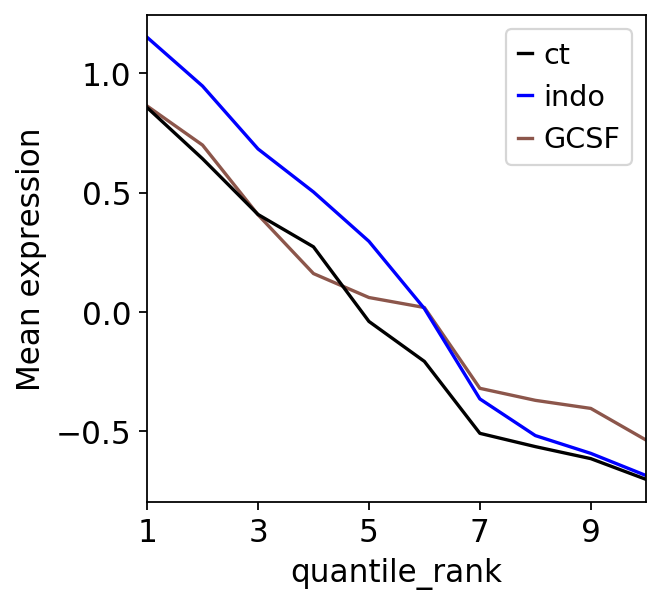

In [122]:
plot_3gene('Hes1')

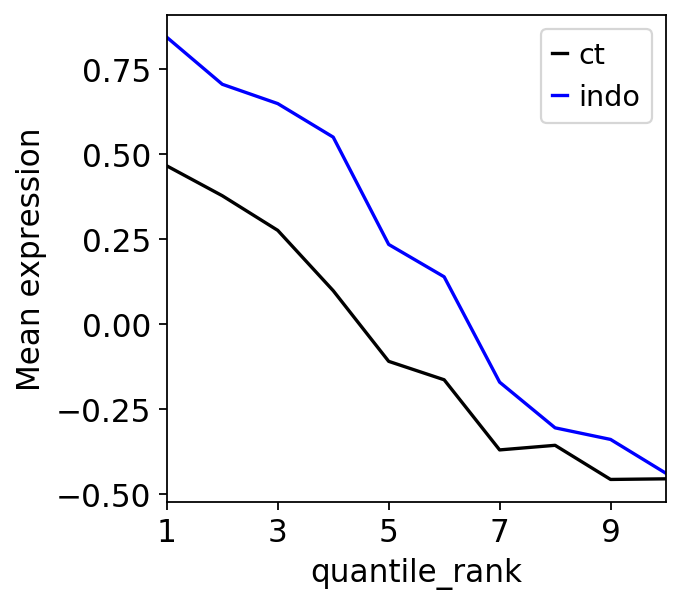

In [123]:
plot_2gene('Klf4')

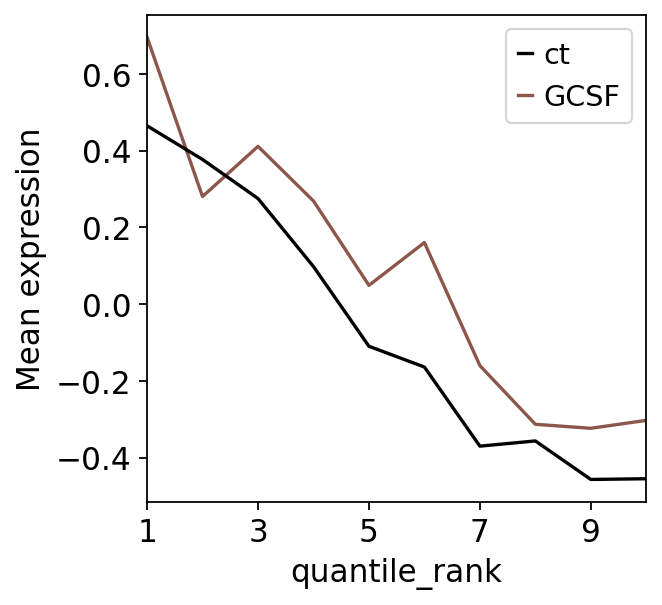

In [124]:
plot_2gene_gcsf('Klf4')

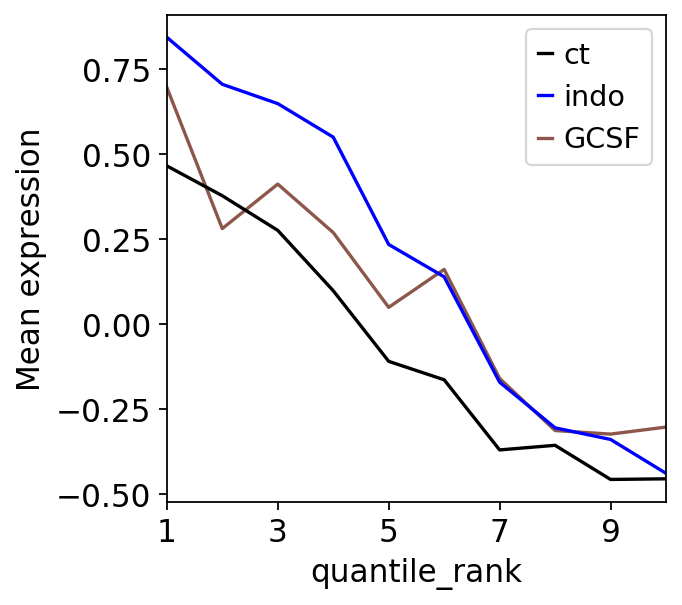

In [125]:
plot_3gene('Klf4')

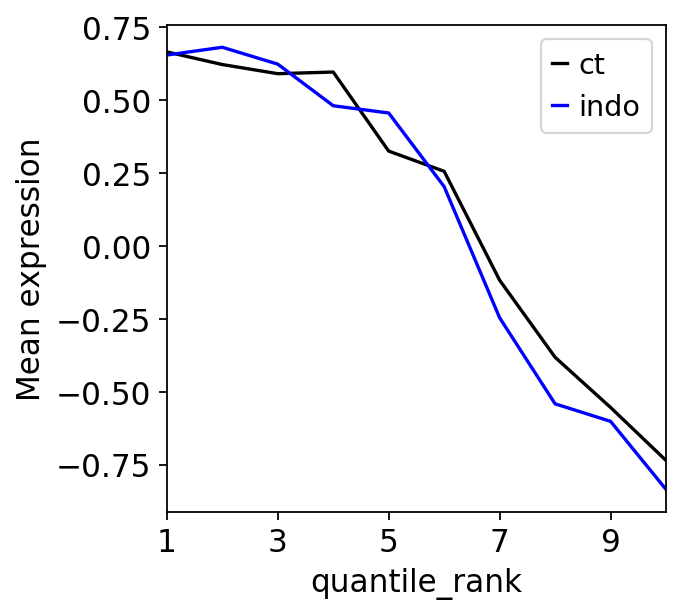

In [126]:
plot_2gene('Ier2')

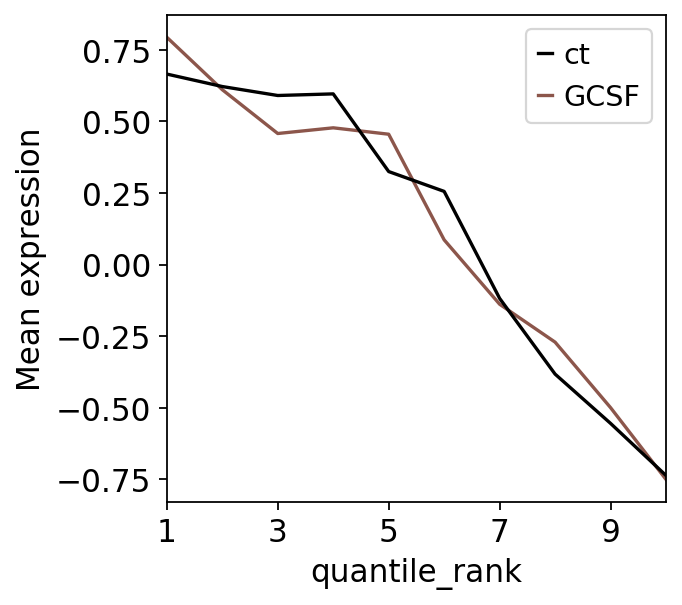

In [127]:
plot_2gene_gcsf('Ier2')

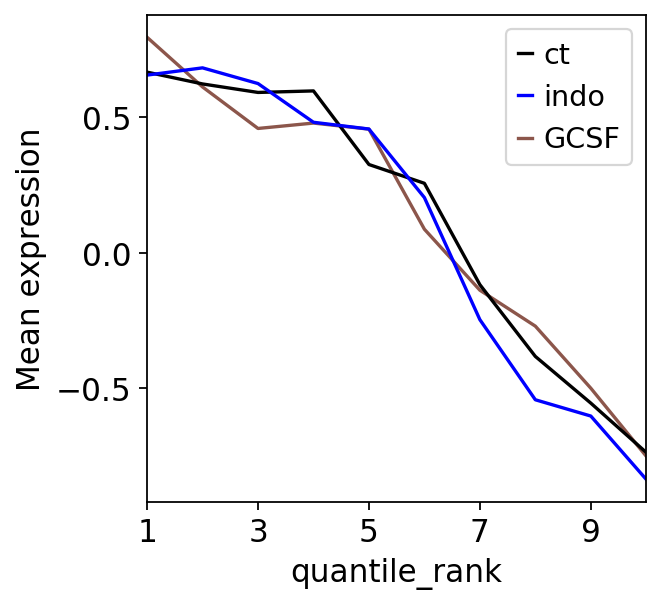

In [128]:
plot_3gene('Ier2')

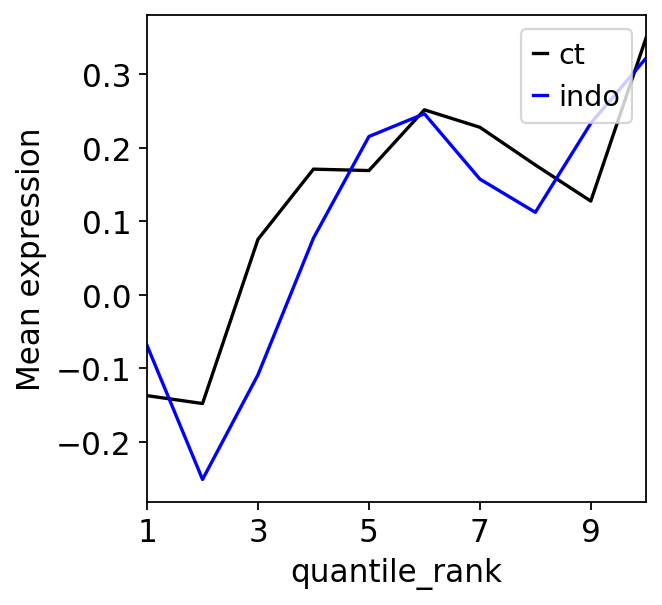

In [129]:
plot_2gene('Ly6a')

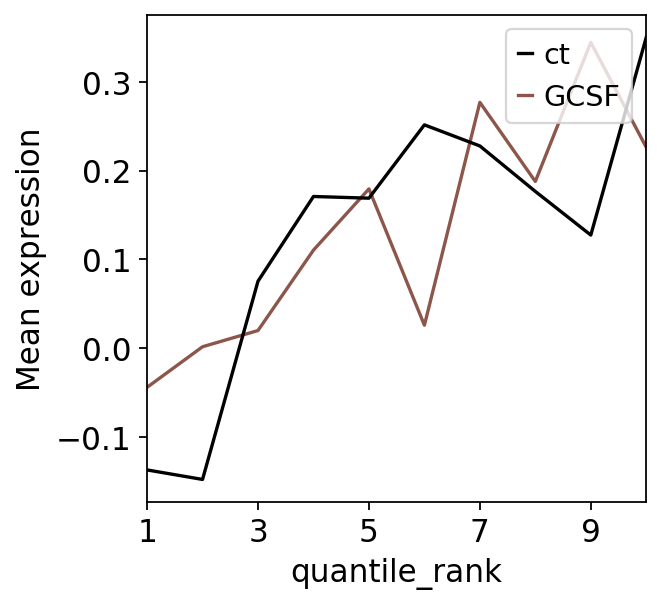

In [130]:
plot_2gene_gcsf('Ly6a')

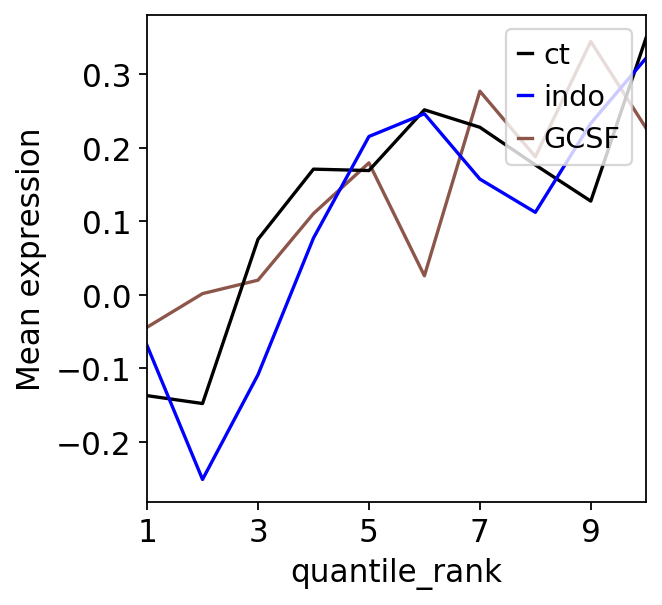

In [131]:
plot_3gene('Ly6a')

### statistics

In [132]:
# make lists:
ct = adata_ctindo.obs[adata_ctindo.obs['sample']=='ct']['dpt_pseudotime'].tolist()
indo = adata_ctindo.obs[adata_ctindo.obs['sample']=='indo']['dpt_pseudotime'].tolist()
GCSF = adata_ctindo.obs[adata_ctindo.obs['sample']=='GCSF']['dpt_pseudotime'].tolist()

In [133]:
print('mean ct')
print(statistics.mean(ct))
print('stdv ct')
print(statistics.stdev(ct))

print('mean indo')
print(statistics.mean(indo))
print('stdv indo')
print(statistics.stdev(indo))

print('mean GCSF')
print(statistics.mean(GCSF))
print('stdv GCSF')
print(statistics.stdev(GCSF))

mean ct
0.6195283134315664
stdv ct
0.14823937837559759
mean indo
0.5903049071232048
stdv indo
0.16309479859158552
mean GCSF
0.6143243668322752
stdv GCSF
0.14798012666612656


In [134]:
# test if it is normally distributed
print('ks test normal dist ct')
print(stats.kstest(ct, 'norm'))
print('ks test normal dist indo')
print(stats.kstest(indo, 'norm'))
print('ks test normal dist GCSF')
print(stats.kstest(GCSF, 'norm'))
print("")
print('ttest indo vs ct')
print(scipy.stats.ttest_ind(ct,indo))
print('ttest GCSF vs ct')
print(scipy.stats.ttest_ind(ct,GCSF))
print("")
print('mannwhiteneyu pseudotime indo vs ct')
print(scipy.stats.mannwhitneyu(ct, indo, use_continuity=True, alternative='two-sided'))
print('mannwhiteneyu pseudotime GCSF vs ct')
print(scipy.stats.mannwhitneyu(ct, GCSF, use_continuity=True, alternative='two-sided'))

ks test normal dist ct
KstestResult(statistic=0.5992677161082756, pvalue=0.0)
ks test normal dist indo
KstestResult(statistic=0.5805370797127654, pvalue=0.0)
ks test normal dist GCSF
KstestResult(statistic=0.59903460702294, pvalue=0.0)

ttest indo vs ct
Ttest_indResult(statistic=7.718554486133065, pvalue=1.3455945139784475e-14)
ttest GCSF vs ct
Ttest_indResult(statistic=1.151417216563202, pvalue=0.24961666448474026)

mannwhiteneyu pseudotime indo vs ct
MannwhitneyuResult(statistic=6321941.5, pvalue=5.845549626202283e-12)
mannwhiteneyu pseudotime GCSF vs ct
MannwhitneyuResult(statistic=2702468.0, pvalue=0.1846954139425615)


In [135]:
sc.logging.print_versions()
pd.show_versions()

scanpy==1.4.6 anndata==0.7.1 umap==0.4.1 numpy==1.17.3 scipy==1.3.1 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.8.0 louvain==0.6.1

INSTALLED VERSIONS
------------------
commit           : None
python           : 3.7.3.final.0
python-bits      : 64
OS               : Linux
OS-release       : 4.19.76-linuxkit
machine          : x86_64
processor        : x86_64
byteorder        : little
LC_ALL           : en_US.UTF-8
LANG             : en_US.UTF-8
LOCALE           : en_US.UTF-8

pandas           : 0.25.3
numpy            : 1.17.3
pytz             : 2019.3
dateutil         : 2.8.1
pip              : 19.3.1
setuptools       : 41.6.0.post20191101
Cython           : 0.29.14
pytest           : None
hypothesis       : None
sphinx           : None
blosc            : None
feather          : None
xlsxwriter       : None
lxml.etree       : None
html5lib         : None
pymysql          : None
psycopg2         : None
jinja2           : 2.10.3
IPython          : 7.9.0
pan

In [136]:
!pip list

Package                Version            
---------------------- -------------------
alembic                1.3.0              
anndata                0.7.1              
async-generator        1.10               
attrs                  19.3.0             
backcall               0.1.0              
beautifulsoup4         4.8.1              
bleach                 3.1.0              
blinker                1.4                
bokeh                  1.3.4              
cellbrowser            0.7.7              
certifi                2020.4.5.1         
certipy                0.1.3              
cffi                   1.13.2             
chardet                3.0.4              
Click                  7.0                
cloudpickle            1.2.2              
conda                  4.7.12             
conda-package-handling 1.6.0              
cryptography           2.8                
cycler                 0.10.0             
Cython                 0.29.14            
cytoolz    